In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import pandas_profiling
%matplotlib inline

In [2]:
train_org = pd.read_csv('HR_Analytics_train.csv')
test_org = pd.read_csv('HR_Analytics_test.csv')
train_org.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [3]:
train_org.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [4]:
test_org.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23490 entries, 0 to 23489
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           23490 non-null  int64  
 1   department            23490 non-null  object 
 2   region                23490 non-null  object 
 3   education             22456 non-null  object 
 4   gender                23490 non-null  object 
 5   recruitment_channel   23490 non-null  object 
 6   no_of_trainings       23490 non-null  int64  
 7   age                   23490 non-null  int64  
 8   previous_year_rating  21678 non-null  float64
 9   length_of_service     23490 non-null  int64  
 10  KPIs_met >80%         23490 non-null  int64  
 11  awards_won?           23490 non-null  int64  
 12  avg_training_score    23490 non-null  int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 2.3+ MB


In [5]:
train_org.describe(include='all')

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808,54808,52399,54808,54808,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
unique,NaN,9,34,3,2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Sales & Marketing,region_2,Bachelor's,m,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,16840,12343,36669,38496,30446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,39195.830627,NaN,NaN,NaN,NaN,NaN,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,NaN,NaN,NaN,NaN,NaN,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,NaN,NaN,NaN,NaN,NaN,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,NaN,NaN,NaN,NaN,NaN,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,NaN,NaN,NaN,NaN,NaN,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000


# Visualisation

<AxesSubplot:xlabel='is_promoted', ylabel='count'>

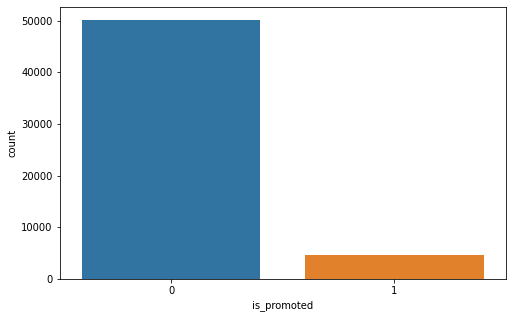

In [6]:
plt.figure(figsize=(8,5))
sns.countplot(train_org.is_promoted)

In [7]:
import pandas_profiling as pp
pp.ProfileReport(train_org)

# Preprocessing

In [8]:
v = train_org.region.value_counts()
train_org.region = train_org.region.apply(lambda x:v[x])
test_org.region = test_org.region.apply(lambda x:v[x])

In [13]:
train_org.education.value_counts()

Bachelor's          36669
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

In [14]:
train_org.education.fillna('Bachelor\'s',inplace=True)
test_org.education.fillna('Bachelor\'s',inplace=True)
train_org.previous_year_rating.fillna(3,inplace=True)
test_org.previous_year_rating.fillna(3,inplace=True)

In [15]:
train_org.education.replace({'Below Secondary':0,'Bachelor\'s':1,'Master\'s & above':2},inplace=True)
test_org.education.replace({'Below Secondary':0,'Bachelor\'s':1,'Master\'s & above':2},inplace=True)

In [16]:
train_org.gender.replace({'f':0,'m':1},inplace=True)
test_org.gender.replace({'f':0,'m':1},inplace=True)

In [17]:
v1 = train_org.department.value_counts()
train_org.department = train_org.department.apply(lambda x:v1[x])
test_org.department = test_org.department.apply(lambda x:v1[x])

In [18]:
v2 = train_org.recruitment_channel.value_counts()
train_org.recruitment_channel = train_org.recruitment_channel.apply(lambda x:v2[x])
test_org.recruitment_channel = test_org.recruitment_channel.apply(lambda x:v2[x])

In [19]:
pp.ProfileReport(train_org)

<AxesSubplot:>

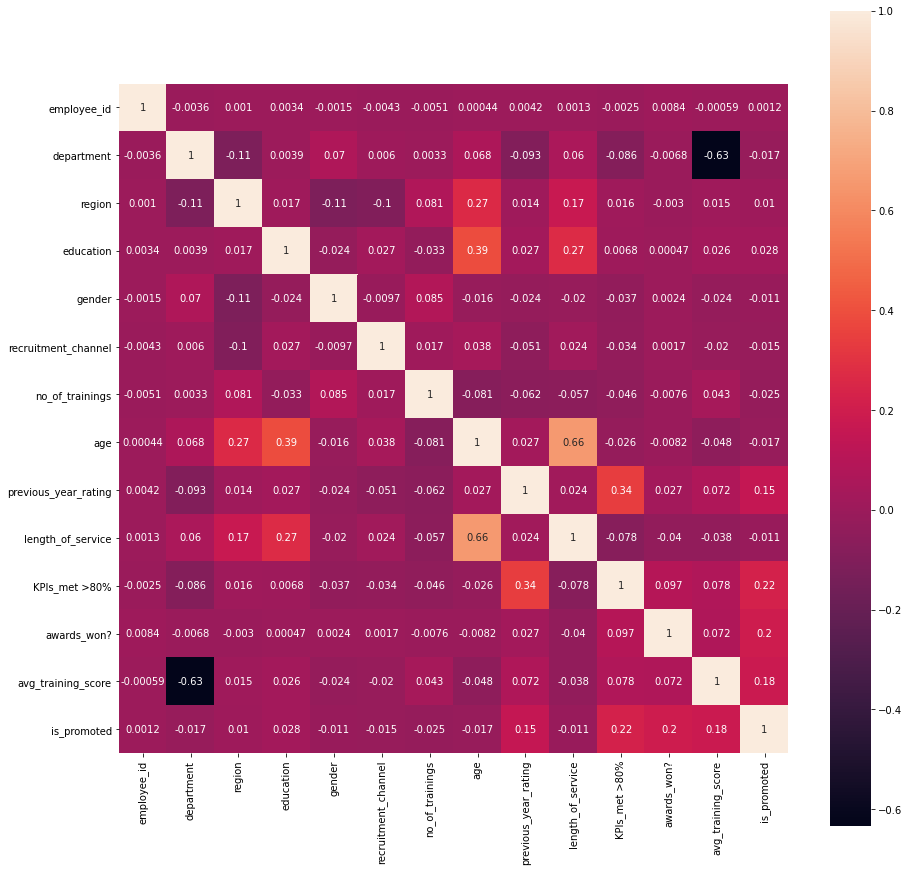

In [20]:
plt.figure(figsize=(15,15))
sns.heatmap(train_org.corr(),annot=True,square=True)

# Modelling

In [21]:
X = train_org.drop(['employee_id','is_promoted'],1)
y = train_org.is_promoted

In [22]:
from sklearn.model_selection import cross_val_score,cross_val_predict,KFold,train_test_split
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
#from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

In [23]:
scale = StandardScaler()
X_scale = scale.fit_transform(X)

In [24]:
from sklearn.decomposition import PCA
pca = PCA(.95)
X_scale_pca = pca.fit_transform(X_scale)
pca.explained_variance_ratio_

array([0.16746189, 0.14503513, 0.10905624, 0.09317985, 0.0881925 ,
       0.08251572, 0.08023398, 0.06944066, 0.05743011, 0.0524756 ,
       0.0291274 ])

In [25]:
x_train,x_test,y_train,y_test = train_test_split(X_scale,y,test_size=.25,random_state=26,stratify=y)

In [26]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=26)
x_train_smote, y_train_smote = sm.fit_sample(x_train,y_train)

In [27]:
y_train_smote.value_counts()

1    37605
0    37605
Name: is_promoted, dtype: int64

In [28]:
kf = KFold(n_splits=4,shuffle=True,random_state=26)
lr = LogisticRegression()
rid = RidgeClassifier(alpha=1)
rr = RandomForestClassifier(n_estimators=100)
#svc_lin = SVC(kernel='linear',probability=True)
#svc_rbf = SVC(kernel='rbf',probability=True)
nb = GaussianNB()
knn = KNeighborsClassifier(n_neighbors=3)
xx = XGBClassifier()

In [29]:
lr_score = cross_val_score(lr,X_scale_pca,y,cv=kf,scoring='f1')
lr_score.mean()

0.20833903527565195

In [34]:
lr_smote = LogisticRegression(C=1,penalty='l2').fit(x_train_smote,y_train_smote)
metrics.f1_score(y_test,lr_smote.predict(x_test))

0.32970391595033427

In [35]:
rid_score = cross_val_score(rid,X_scale_pca,y,cv=kf,scoring='f1')
rid_score.mean()

0.08739011663130229

In [37]:
rid_smote = RidgeClassifier(alpha=2).fit(x_train_smote,y_train_smote)
metrics.f1_score(y_test,rid_smote.predict(x_test))

0.32746545523376863

In [38]:
rr_score = cross_val_score(rr,X_scale,y,cv=kf,scoring='f1')
rr_score.mean()

0.4221363338242011

In [39]:
rr_smote = RandomForestClassifier(n_estimators=100).fit(x_train_smote,y_train_smote)
metrics.f1_score(y_test,rr_smote.predict(x_test))

0.4514767932489451

0.9554015427385567


<AxesSubplot:>

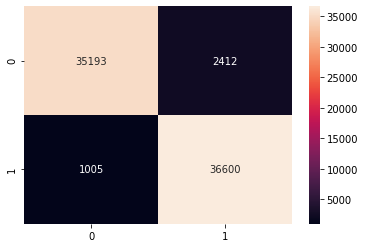

In [49]:
rr_pred = cross_val_predict(rr,x_train_smote,y_train_smote,cv=kf,method='predict_proba')[:,1]
rr_pred = (rr_pred>0.4).astype('int')
print(metrics.f1_score(y_train_smote,rr_pred))
sns.heatmap(metrics.confusion_matrix(y_train_smote,rr_pred),annot=True,fmt='d')

In [40]:
nb_score = cross_val_score(nb,X_scale_pca,y,cv=kf,scoring='f1')
nb_score.mean()

0.23801562989721747

In [41]:
nb_smote = GaussianNB().fit(x_train_smote,y_train_smote)
metrics.f1_score(y_test,nb_smote.predict(x_test))

0.2925998052580331

In [42]:
knn_score = cross_val_score(knn,X_scale_pca,y,cv=kf,scoring='f1')
knn_score.mean()

0.2854981528756937

In [43]:
knn_smote = KNeighborsClassifier(n_neighbors=3).fit(x_train_smote,y_train_smote)
metrics.f1_score(y_test,knn_smote.predict(x_test))

0.33411903358868594

In [44]:
xx_score = cross_val_score(xx,X_scale,y,cv=kf,scoring='f1')
xx_score.mean()

0.484640262650049

In [45]:
xx_smote = XGBClassifier().fit(x_train_smote,y_train_smote)
metrics.f1_score(y_test,xx_smote.predict(x_test))

0.4685929648241205

0.9635476814803744


<AxesSubplot:>

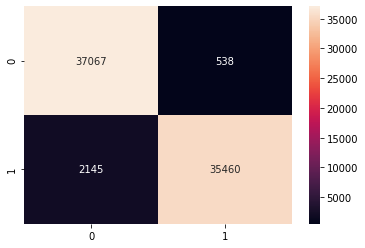

In [47]:
xx_pred = cross_val_predict(xx_smote,x_train_smote,y_train_smote,cv=kf,method='predict_proba')[:,1]
xx_pred = (xx_pred>0.4).astype('int')
print(metrics.f1_score(y_train_smote,xx_pred))
sns.heatmap(metrics.confusion_matrix(y_train_smote,xx_pred),annot=True,fmt='d')

0.9641461978915823


<AxesSubplot:>

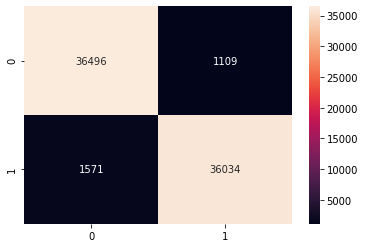

In [50]:
xx_pred = cross_val_predict(xx_smote,x_train_smote,y_train_smote,cv=kf,method='predict_proba')[:,1]
rr_pred = cross_val_predict(rr_smote,x_train_smote,y_train_smote,cv=kf,method='predict_proba')[:,1]
pred = (xx_pred+rr_pred)/2.
pred = (pred>0.4).astype('int')
print(metrics.f1_score(y_train_smote,pred))
sns.heatmap(metrics.confusion_matrix(y_train_smote,pred),annot=True,fmt='d')

In [51]:
test_org.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,8724,7138,2260,1,1,23220,1,24,3.0,1,1,0,77
1,74430,2418,1703,1,0,30446,1,31,3.0,5,0,0,51
2,72255,16840,2648,1,1,30446,1,31,1.0,4,0,0,47
3,38562,7138,12343,1,0,30446,3,31,2.0,9,0,0,65
4,64486,2536,994,1,1,23220,1,30,4.0,7,0,0,61


In [52]:
test_cc = test_org.iloc[:,1:].copy()
test_cc_scale = scale.transform(test_cc)
test_cc_scale_pca = pca.transform(test_cc_scale)

In [53]:
xx = XGBClassifier().fit(x_train_smote,y_train_smote)
pred_xx = xx.predict_proba(test_cc_scale)[:,1]
rr = RandomForestClassifier(n_estimators=100).fit(x_train_smote,y_train_smote)
pred_rr = rr.predict_proba(test_cc_scale)[:,1]

tot_pred = (pred_xx+pred_rr)/2.
tot_pred = (tot_pred>0.4).astype('int')

In [56]:
metrics.f1_score(y_test,rr.predict(x_test))

0.4439701173959445

In [126]:
xx = XGBClassifier().fit(X_scale,y)
pred_xx = xx.predict_proba(test_cc_scale)[:,1]
pred_xx = (pred_xx>0.4).astype('int')

In [54]:
submissions = pd.DataFrame({'employee_id':test_org.employee_id,'is_promoted':tot_pred})
submissions.to_csv('HR_analytics_pred.csv',index=False)